# Capstone Project - The Battle of the Neighborhoods
### Applied Data Science Capstone by IBM/Coursera

## Table of contents
* [Introduction: Business Problem](#introduction)
* [Data](#data)
* [Methodology](#methodology)
* [Analysis](#analysis)
* [Results and Discussion](#results)
* [Conclusion](#conclusion)
* [Reference](#reference)

## <a name="introduction"></a>Introduction: Business Problem

In this project we are going to look for an optimal location to open a cinema. Specifically, this report can provide a reference for stakeholders who are interested in **opening a cinema in Montreal, Quebec, Canada**.

Montreal is the second largest city in Canada and the largest city in the province of Quebec, located along the Saint Lawrence River at its junction with the Ottawa River. It sits on an island. In this report, we will focus on all areas on the Montreal island. There are many cinemas on Montreal island, we will **conclude where are the existing cinemas**. Then we will use clustering model to **find the similar areas** on the island considering demographic data of each borough and region. The preferred area shall be **distant from existing cinemas**.

We will use data science tools to fetch the raw data, visualize it then **generate a few most promissing areas based on above criteria**. In the meanwhile, we will also explain the advantage and traits for the candidates, so that **stakeholders can make the final decision** base on the analysis.

## <a name="data"></a>Data

Based on definition of our problem, factors that may impact our decision are:
* Demographic information, e.g. population, density, education, age, income
* Number of existing shopping malls in the neighborhood and nearby
* Number of existing cinemas in the neighborhood and nearby

We decided to use regularly spaced grid of locations all around the whole Montreal island, to define our neighborhoods. Concretely, we will use popular hexagon honeycomb to define our neighborhoods.

In this project, we will fetch or extract data from the following data sources:
* [Montreal census information of 2016 year](http://ville.montreal.qc.ca/pls/portal/url/ITEM/55637C4923B8B03EE0530A930132B03E)
* Centers of hexagon neighborhoods will be generated algorithmically and approximate addresses of centers of those areas will be obtained using **Google Geocoding API**
* Shopping malls and cinemas data in every neighborhood will be obtained using **Foursquare API**
* Coordinate of Montreal center will be obtained using **Google Geocoding API** of well known Montreal location
* Montreal borough shape file is obtained from [Carto](https://jmacman12.carto.com/tables/montreal_shapefile/public)

### Neighborhood Candidates

We will use popular hexagon honeycomb grid on map, each grid of cell represents a candidate of interest, the length of side is 500 meters, it covers around area of 0.65 square kilometers. Since we only focus on Montreal island, we will calculate the honeycomb grid covering the island only.

Firstly, we will find the latitude & longitude of Montreal city center using Google Geocoding API.

In [1]:
# The code was removed by Watson Studio for sharing.

In [2]:
# Define method to obtain the latitude and longitude of Montreal center
import requests

def get_coordinates(address, api_key=google_api_key, verbose=False):
    try:
        url = 'https://maps.googleapis.com/maps/api/geocode/json?key={}&address={}'.format(api_key, address)
        response = requests.get(url)
        if verbose:
            print('Google Maps API JSON result =>', response.content)
        results = response.json()['results']
        geographical_data = results[0]['geometry']['location'] # get geographical coordinates
        lat = geographical_data['lat']
        lon = geographical_data['lng']
        return [lat, lon]
    except:
        return [None, None]
    
address = '1 Boulevard René-Lévesque O, Montréal, QC H2X, Canada'    # Montreal address in publicity
# Latitude, Longtitude of Montreal in publicity: 45.508888, -73.561668
# montreal_center = (45.508888, -73.561668)

montreal_center = get_coordinates(address)
print('Coordinate of "{}": {}'.format(address, montreal_center))

Coordinate of "1 Boulevard René-Lévesque O, Montréal, QC H2X, Canada": [45.5088756, -73.5615771]


In [3]:
# Conversely, define a method to get address information given latitude and longtitude
def get_address(latitude, longitude, api_key=google_api_key, verbose=False):
    try:
        url = 'https://maps.googleapis.com/maps/api/geocode/json?key={}&latlng={},{}'.format(api_key, latitude, longitude)
        response = requests.get(url).json()
        if verbose:
            print('Google Maps API JSON result =>', response)
        results = response['results']
        address = results[0]['formatted_address']
        return address
    except:
        return None

addr = get_address(*montreal_center)
print('Reverse geocoding check')
print('-----------------------')
print('Address of [{}, {}] is: {}'.format(*montreal_center, addr))


Reverse geocoding check
-----------------------
Address of [45.5088756, -73.5615771] is: 1 Boulevard René-Lévesque O, Montréal, QC H2X, Canada


Next, Montreal sits on an island, we only focus on the area in the Montreal island, so try to find the boundary of Montreal island first.
We download Montreal shape file (in geojson format) from [Carto](https://jmacman12.carto.com/tables/montreal_shapefile/public) which defines boundaries of boroughs and municipalities on Montreal island.

When we generate candidate hexagon grid, we will limit the hexagon within island's boundary. So we will define several convenient methods first.

In [5]:
# Set flag to true if we load the data from IBM Cloud
From_IBM_Cloud = True

In [6]:
# Suppress warnings

import warnings
warnings.filterwarnings('ignore')
warnings.simplefilter('ignore')

In [7]:
# The code was removed by Watson Studio for sharing.

In [8]:
def load_dict(fileobject):
    '''Load the file contents into a Python dict'''
    text = fileobject.read()
    dictformat = json.loads(text)
    return dictformat

In [9]:
# !pip install shapely
import os
import json
from shapely.geometry import shape, Point, Polygon

def read_geojson(filepath):
    with open(filepath, 'r') as f:
        js = json.load(f)
    return js

# get boundary from a geojson file
# output format: (minx, miny, maxx, maxy) tuple (float values) 
def get_boundary_from_geojson(geojson):
    js = read_geojson(geojson) if isinstance(geojson, str) else geojson
    polygon = [shape(feature['geometry']).bounds for feature in js['features']]

    boundary = []
    for p in polygon:
        boundary.append((p[0], p[1]))
        boundary.append((p[2], p[3]))
    return Polygon(boundary).bounds

# Given a point, check whether it's within the boundaries defined by GeoJSON file
# input: point = (longtitude, latitude)
# output: True if in polygon of geojson file
def is_in_geojson(geojson, point, verbose=False):    
    js = read_geojson(geojson) if isinstance(geojson, str) else geojson
    pos = point if isinstance(point, Point) else Point(point)

    for feature in js['features']:
        polygon = shape(feature['geometry'])
        if polygon.contains(pos):
            if verbose: print('Found in borough: ', feature['properties'])
            return True
    return False

# load GeoJSON file containing montreal boroughs
geoJson = load_dict(streaming_body_1) if From_IBM_Cloud else os.path.join(os.getcwd(), 'montreal_shapefile.geojson')
# get the boundaries of Montreal island
montreal_boundary = get_boundary_from_geojson(geoJson)
print(f'The boundaries of Montreal island: {montreal_boundary}\n')

# check whether montreal center is on Montreal island
point = Point((montreal_center[1], montreal_center[0]))
print(f'Montreal center ({point.x}, {point.y}) in geojson file: {is_in_geojson(geoJson, point, True)}')


The boundaries of Montreal island: (-73.976376, 45.40213, -73.476066, 45.703748)

Found in borough:  {'cartodb_id': 31, 'district': 'Ville-Marie', 'type': 'BOROUGH'}
Montreal center (-73.5615771, 45.5088756) in geojson file: True


Looks good.

But we also can notice it uses latitude and longitude degrees(WGS84 spherical coordinate system) in the geojson definition file, not the common metric unit - meter or kilometer which is UTM Cartesian coordinate system (X/Y coordinates in meters).

So we will create several methods to convert latitude and longitude degrees into meters and vice versa.

In [10]:
# !pip install shapely
import shapely.geometry

# !pip install pyproj
import pyproj

import math

def lonlat_to_xy(lon, lat):
    proj_latlon = pyproj.Proj(proj='latlong',datum='WGS84')
    proj_xy = pyproj.Proj(proj="utm", zone=18, datum='WGS84')
    xy = pyproj.transform(proj_latlon, proj_xy, lon, lat)
    return xy[0], xy[1]

def xy_to_lonlat(x, y):
    proj_latlon = pyproj.Proj(proj='latlong',datum='WGS84')
    proj_xy = pyproj.Proj(proj="utm", zone=18, datum='WGS84')
    lonlat = pyproj.transform(proj_xy, proj_latlon, x, y)
    return lonlat[0], lonlat[1]

def calc_xy_distance(x1, y1, x2, y2):
    dx = x2 - x1
    dy = y2 - y1
    return math.sqrt(dx*dx + dy*dy)

def calc_lonlat_distance(lon1, lat1, lon2, lat2):
    x1, y1 = lonlat_to_xy(lon1, lat1)
    x2, y2 = lonlat_to_xy(lon2, lat2)
    return calc_xy_distance(x1, y1, x2, y2)

print('Coordinate transformation check')
print('-------------------------------')
print('Montreal center longitude = {}, latitude = {}'.format(montreal_center[1], montreal_center[0]))
x, y = lonlat_to_xy(montreal_center[1], montreal_center[0])
print('Montreal center UTM X = {}, Y = {}'.format(x, y))
lo, la = xy_to_lonlat(x, y)
print('Montreal center longitude = {}, latitude = {}'.format(lo, la))
distance = calc_lonlat_distance(*montreal_boundary)
print(f'Distance from most southwest point to most northeast point in Montreal is {distance} meters.')
mtl_min_x, mtl_min_y = lonlat_to_xy(montreal_boundary[0], montreal_boundary[1])
mtl_max_x, mtl_max_y = lonlat_to_xy(montreal_boundary[2], montreal_boundary[3])
print(f'Distance from west to east in Montreal is {mtl_max_x-mtl_min_x} meters.')
print(f'Distance from north to south in Montreal is {mtl_max_y-mtl_min_y} meters.')


Coordinate transformation check
-------------------------------
Montreal center longitude = -73.5615771, latitude = 45.5088756
Montreal center UTM X = 612361.5293772814, Y = 5040488.807028589
Montreal center longitude = -73.5615771, latitude = 45.5088756
Distance from most southwest point to most northeast point in Montreal is 51463.349863055475 meters.
Distance from west to east in Montreal is 38518.73919172608 meters.
Distance from north to south in Montreal is 34128.91897214204 meters.


Now we can create **honeycomb grid of cells** with regular hexagons. The centers of hexagon are equally distant in one row, and we offset every other row. So that we covers all the areas on the island without spacing among candidate hexagons. And **every cell center is same distant from all its neighbors' center**.

In this project, we define length of side of the hexagon with 500 meters. From geometric, we can calculate to know the distant between two centers of hexagons in one row is 1000 meters.

In [11]:
mtl_center_x, mtl_center_y = lonlat_to_xy(montreal_center[1], montreal_center[0]) # City center in Cartesian coordinates
montreal_boroughs = geoJson if From_IBM_Cloud else read_geojson(geoJson)

k = math.sqrt(3) / 2 # Vertical distance coefficient for hexagon grid cells
x_step = 1000        # Distance between adjacent hexagons in the row
y_step = x_step * k  # Distance between adjacent hexagons in vertical direction

latitudes = []
longitudes = []
distances_from_downtown = []
xs = []
ys = []
num_columns = int((mtl_max_x - mtl_min_x)/x_step) + 1
num_rows = int((mtl_max_y - mtl_min_y)/y_step) + 1
for i in range(0, num_rows):
    y = mtl_min_y + i * y_step
    x_offset = x_step/2 if i%2==0 else 0
    for j in range(0, num_columns):
        x = mtl_min_x + j * x_step + x_offset
        lon, lat = xy_to_lonlat(x, y)
        if is_in_geojson(montreal_boroughs, (lon, lat)):
            distance = calc_xy_distance(mtl_center_x, mtl_center_y, x, y)
            latitudes.append(lat)
            longitudes.append(lon)
            distances_from_downtown.append(distance)
            xs.append(x)
            ys.append(y)

print(len(latitudes), 'candidate neighborhood centers are generated.')

569 candidate neighborhood centers are generated.


Next, we will calculate the boundary of each hexagons according to geometric knowledge.

In [12]:
import numpy as np
import math

def get_hexagon_coordinates(centroid_latlon, side_length_in_meters, rotate=False):
    # Rotate 90 degree
    unit_hexagon_vertices_rotate = np.array([[0, 1], [-math.sqrt(3)/2, 1/2], [-math.sqrt(3)/2, -1/2],
                                       [0, -1], [math.sqrt(3)/2, -1/2], [math.sqrt(3)/2, 1/2]])
    # Regular hexagon
    unit_hexagon_vertices = np.array([[1, 0], [1/2, math.sqrt(3)/2], [-1/2, math.sqrt(3)/2],
                                       [-1, 0], [-1/2, -math.sqrt(3)/2], [1/2, -math.sqrt(3)/2]])
    x, y = lonlat_to_xy(centroid_latlon[1], centroid_latlon[0])
    vertices = unit_hexagon_vertices_rotate if rotate else unit_hexagon_vertices
    vertices *= side_length_in_meters
    vertices = [xy_to_lonlat(v[0]+x, v[1]+y) for v in vertices]
    return vertices     # list of 6 (longitude, latitude) tuples

a = x_step/math.sqrt(3)
hexagons = []
for latlon in zip(latitudes, longitudes):
    vertices = get_hexagon_coordinates(latlon, a, True)
    hexagons.append(Polygon(vertices))

print(len(hexagons), 'candidate hexagon neighborhoods generated.')


569 candidate hexagon neighborhoods generated.


Let's visualize the data we have so far:
* Montreal city center
* Boundary of Montreal island and all boroughs and municipalities inside
* Candidate neighbourhoods in hexagon

In [13]:
# !pip install folium
import folium
from folium.features import DivIcon

In [14]:
def hexagon_style(feature):
    return { 'color': 'blue', 'fill': False }
def boroughs_style(feature):
    return { 'color': 'gray' }

In [15]:
center = xy_to_lonlat((mtl_max_x+mtl_min_x)/2, (mtl_max_y+mtl_min_y)/2)
map_montreal = folium.Map(location=(center[1], center[0]), zoom_start=11)
folium.Marker(montreal_center, popup='Downtown Montreal').add_to(map_montreal)
folium.GeoJson(montreal_boroughs, style_function=boroughs_style, name='geojson').add_to(map_montreal)
for i, hexagon in enumerate(hexagons):
    folium.GeoJson(hexagon.convex_hull, style_function=hexagon_style).add_to(map_montreal)
    # folium.map.Marker((hexagon.centroid.y, hexagon.centroid.x),
    #                   icon=DivIcon(html=f'<div style="font-size: 12pt">{i}</div>', )
    #                  ).add_to(map_montreal)
map_montreal

Nice!

From the map, we can see all the candidate neighborhoods within Montreal island, there is no spacing among these neighborhoods, in another word, it covers all the area on Montreal island. Furthermore, all neighborhoods are same distance of one kilometer to the adjacent ones.

Let's get approximate addresses of each center of candidate neighborhoods using **Google Geocoding APIs**.

In [16]:
# Define a method to fetch all address given latitudes and longitudes list
def get_all_addresses(latitudes, longitudes):
    print('Obtaining location addresses: ', end='')
    addresses = []
    for lat, lon in zip(latitudes, longitudes):
        address = get_address(lat, lon)
        if address is None:
            address = 'NO ADDRESS'
        address = address.replace(', Canada', '') # We don't need country part of address
        addresses.append(address)
        print(' .', end='')
    print(' done.')
    return addresses

In [25]:
# The code was removed by Watson Studio for sharing.

In [40]:
import pandas as pd

try:
    # Read locations dataframe file if exists.
    df_locations = pd.read_pickle('locations.pkl')
    print('Location dataframe is loaded from file.')

except:
    # If file doesn't exist, fetch data from Foursquare API
    addresses = get_all_addresses(latitudes, longitudes)
    df_locations = pd.DataFrame({'Address': addresses,
                             'Latitude': latitudes,
                             'Longitude': longitudes,
                             'X': xs,
                             'Y': ys,
                             'Distance from downtown': distances_from_downtown})

    if not From_IBM_Cloud:
        # Save dataframe into local file
        df_locations.to_pickle('./locations.pkl')


Obtaining location addresses:  . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . .

Looks good. Let's check the first 10 items in the dataframe.

In [26]:
df_locations.head(10)

,Address,Latitude,Longitude,X,Y,Distance from downtown
0,"2 Rue Forbes, Sainte-Anne-de-Bellevue, QC H9X 1W8",45.409692,-73.950681,582110.849218,5.028999e+06,32359.175834
1,"17 Rue East Cottages, Sainte-Anne-de-Bellevue,...",45.409574,-73.937904,583110.849218,5.028999e+06,31426.340867
2,"714 Rue Victoria, Baie-d'Urfé, QC H9X 2K7",45.409455,-73.925127,584110.849218,5.028999e+06,30497.762869
3,"20 Avenue Morningside, Senneville, QC H9X 1A9",45.417545,-73.956926,581610.849218,5.029865e+06,32534.078157
4,"21123 Ch Ste-Marie, Sainte-Anne-de-Bellevue, Q...",45.417427,-73.944147,582610.849218,5.029865e+06,31590.582160
5,"Rond-point Clark-Graham, Baie-d'Urfé, QC H9X 4B6",45.417308,-73.931368,583610.849218,5.029865e+06,30650.669175
6,"90 Rue Morgan, Baie-d'Urfé, QC H9X 3A8",45.417188,-73.918589,584610.849218,5.029865e+06,29714.679210
7,"207 Rue Calais, Baie-d'Urfé, QC H9X 2L6",45.417066,-73.905811,585610.849218,5.029865e+06,28782.994984
8,"Beaconsfield / Redfern, Beaconsfield, QC H9W 4M9",45.416943,-73.893032,586610.849218,5.029865e+06,27856.048534
9,"458 Rue Lakeshore, Beaconsfield, QC H9W 4J6",45.416819,-73.880254,587610.849218,5.029865e+06,26934.329017


### Foursquare API

Now we generated all the candidate neighbourhoods on Montreal island, we will get all cinema information using Foursquare API.

From Foursquare API documentation, we can find corresponding cinema category in [Venue Categories](https://developer.foursquare.com/docs/build-with-foursquare/categories). In Foursquare, it's called **Movie Theater** with id `4bf58dd8d48988d17f941735` under **Arts & Entertainment** category. It contains several sub-categories:
* Drive-in Theater, id: `56aa371be4b08b9a8d5734de`
* Indie Movie Theater, id: `4bf58dd8d48988d17e941735`
* Multiplex, id: `4bf58dd8d48988d180941735`

Unlike coffee shop, restaurant everywhere, there aren't lots of cinemas in the region, it also makes sense since we don't expect cinema in every block.

Let's fetch all the cinemas on Montreal island first. To do so, we will fetch cinemas data in each boroughs and municipalities.

In [27]:
# Get center coordinates of each borough and municipality

def get_borough_center(borough_geojson):
    center = []
    for feature in borough_geojson['features']:
        polygon = shape(feature['geometry'])
        center.append((polygon.centroid.x, polygon.centroid.y))
    return center

montreal_borough_centers = get_borough_center(montreal_boroughs)
print(f'{len(montreal_borough_centers)} center coordinates are generated.')

33 center coordinates are generated.


Foursquare credentials are defined in hidden cell bellow.

In [32]:
# The code was removed by Watson Studio for sharing.

In [33]:
from datetime import date

cinema_categories = ['4bf58dd8d48988d17f941735',]  # Movie Theater

def is_cinema(categories, cinema_filter=cinema_categories):
    for c in categories:
        category_id = c[1]
        if category_id in cinema_filter:
            return True
    return False

def get_categories(categories):
    return [(cat['name'], cat['id']) for cat in categories]

def format_address(location):
    return location['formattedAddress'][0]

# Searching for cinema based on latitude and longitude
def get_cinemas_near_location(lat, lon, category, client_id, client_secret, radius=600, limit=50):
    version = date.today().strftime("%Y%m%d")
    categories = category if isinstance(category, str) else ','.join(category)
    url = 'https://api.foursquare.com/v2/venues/search?client_id={}&client_secret={}&v={}&ll={},{}&categoryId={}&radius={}&limit={}'.format(client_id, client_secret, version, lat, lon, categories, radius, limit)
    try:
        results = requests.get(url).json()['response']['venues']
        venues = [(item['id'],
                   item['name'],
                   get_categories(item['categories']),
                   (item['location']['lat'], item['location']['lng']),
                   format_address(item['location']),
                   item['location']['distance']) for item in results]        
    except:
        venues = []
        print(f'\nError on {url}')
    return venues

In [34]:
# Let's go over all borough and municipality's centers to find all cinemas on Montreal island

import pickle

def get_cinemas(lonlats):
    all_cinemas = {}

    print('Obtaining cinemas on Montreal island:', end='')
    for lon, lat in lonlats:
        # We will set bigger searching area to overlap each other so we don't miss any cinema in Montrea island. And we will use dictionary to exclude any duplicated data.
        cinemas = get_cinemas_near_location(lat, lon, cinema_categories, foursquare_client_id, foursquare_client_secret, radius=5000)
        for venue in cinemas:
            venue_latlon = venue[3]
            # Check whether the cinema locates on Montreal island
            if is_in_geojson(montreal_boroughs, (venue_latlon[1], venue_latlon[0])):
                venue_id = venue[0]
                venue_name = venue[1]
                venue_categories = venue[2]
                venue_address = venue[4]
                isCinema = is_cinema(venue_categories)
                if isCinema:
                    x, y = lonlat_to_xy(venue_latlon[1], venue_latlon[0])
                    cinema = (venue_id, venue_name, venue_latlon[0], venue_latlon[1], venue_address, x, y, venue_categories)
                    all_cinemas[venue_id] = cinema
        print(' .', end='')
    print(' done.')
    return all_cinemas


# Try to load from local file system in case we did this before to reduce Foursquare API calls
montreal_cinemas = {}
loaded = False
try:
    with open('montreal_all_cinemas.pkl', 'rb') as f:
        montreal_cinemas = pickle.load(f)
    print('Cinemas data loaded.')
    loaded = True
except:
    pass

# If file doesn't exist, fetch data from Foursquare API
if not loaded:
    montreal_cinemas = get_cinemas(montreal_borough_centers)
    
    if not From_IBM_Cloud:
        # Save cinema data into local file
        with open('montreal_all_cinemas.pkl', 'wb') as f:
            pickle.dump(montreal_cinemas, f)


Obtaining cinemas on Montreal island: . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . done.


In [35]:
import numpy as np

cinemas_by_hexagon = []
for hexagon, lat, lon in zip(hexagons, latitudes, longitudes):
    local_cinemas = []
    for cinema in montreal_cinemas.values():
        if hexagon.contains(Point(cinema[3], cinema[2])):
            local_cinemas.append(cinema)
    cinemas_by_hexagon.append(local_cinemas)

print('Total number of cinemas in Montreal: ', len(montreal_cinemas))
print('Average number of cinemas in neighborhood:', np.array([len(r) for r in cinemas_by_hexagon]).mean())

Total number of cinemas in Montreal:  44
Average number of cinemas in neighborhood: 0.07557117750439367


Let's show the locations of cinemas in the Montreal island.

In [36]:
center = xy_to_lonlat((mtl_max_x+mtl_min_x)/2, (mtl_max_y+mtl_min_y)/2)
map_montreal = folium.Map(location=(center[1], center[0]), zoom_start=11)
folium.Marker(montreal_center, popup='Downtown Montreal').add_to(map_montreal)
folium.GeoJson(montreal_boroughs, style_function=boroughs_style, name='geojson').add_to(map_montreal)
for res in montreal_cinemas.values():
    lat = res[2]; lon = res[3]
    color = 'blue'
    folium.CircleMarker([lat, lon], radius=3, color=color, fill=True, fill_color=color, fill_opacity=1).add_to(map_montreal)
map_montreal

Let's plot heatmap to check the density of cinemas.

In [37]:
from folium import plugins
from folium.plugins import HeatMap

center = xy_to_lonlat((mtl_max_x+mtl_min_x)/2, (mtl_max_y+mtl_min_y)/2)
cinema_latlon = [(res[2], res[3]) for res in montreal_cinemas.values()]

map_montreal = folium.Map(location=(center[1], center[0]), zoom_start=11)
folium.TileLayer('cartodbpositron').add_to(map_montreal)
folium.Marker(montreal_center, popup='Downtown Montreal').add_to(map_montreal)
folium.GeoJson(montreal_boroughs, style_function=boroughs_style, name='geojson').add_to(map_montreal)
HeatMap(cinema_latlon).add_to(map_montreal)
map_montreal

From heatmap, we can see the cinemas are mainly concentrated in downtown areas and center of the island. Usually, there are also a lot of shopping malls nearby, let's pull out the shopping centers data on Montreal island using Foursquare APIs.

From Foursquare API documentation, there are several categories related with shopping mall or shopping centers.

Category|ID|
:---:|:---:
Shopping Mall|4bf58dd8d48988d1fd941735
Shopping Plaza|5744ccdfe4b0c0459246b4dc
Outlet Mall|5744ccdfe4b0c0459246b4df
Outlet Store|52f2ab2ebcbc57f1066b8b35
Supermarket|52f2ab2ebcbc57f1066b8b46

We will fetch all shopping mall data in above categories.



In [38]:
from datetime import date
# Fetch all shopping mall and shopping center

shopping_mall_categories = ['4bf58dd8d48988d1fd941735', '5744ccdfe4b0c0459246b4dc', '5744ccdfe4b0c0459246b4df', '52f2ab2ebcbc57f1066b8b35', '52f2ab2ebcbc57f1066b8b46']

def is_valid_category(categories, category_filter):
    for c in categories:
        category_id = c[1]
        if category_id in category_filter:
            return True
    return False

def get_categories(categories):
    return [(cat['name'], cat['id']) for cat in categories]

def get_nearby_venues(lat, lon, category, client_id, client_secret, radius=600, limit=50):
    version = date.today().strftime("%Y%m%d")
    categories = category if isinstance(category, str) else ','.join(category)
    url = 'https://api.foursquare.com/v2/venues/search?client_id={}&client_secret={}&v={}&ll={},{}&categoryId={}&radius={}&limit={}'.format(client_id, client_secret, version, lat, lon, categories, radius, limit)
    results = requests.get(url).json()['response']['venues']
    venues = [(item['id'],
               item['name'],
               get_categories(item['categories']),
               (item['location']['lat'], item['location']['lng']),
               item['location']['formattedAddress'][0]) for item in results]        
    return venues

def get_shopping_malls(lonlats):
    all_malls = {}

    print('Obtaining shopping malls around candidate locations:', end='')
    for lon, lat in lonlats:
        malls = get_nearby_venues(lat, lon, shopping_mall_categories, foursquare_client_id, foursquare_client_secret, radius=5000)
        for venue in malls:
            venue_latlon = venue[3]
            if is_in_geojson(montreal_boroughs, (venue_latlon[1], venue_latlon[0])):
                venue_id = venue[0]
                venue_name = venue[1]
                venue_categories = venue[2]
                venue_address = venue[4]
                isValid = is_valid_category(venue_categories, shopping_mall_categories)
                if isValid:
                    x, y = lonlat_to_xy(venue_latlon[1], venue_latlon[0])
                    mall = (venue_id, venue_name, venue_latlon[0], venue_latlon[1], venue_address, x, y, venue_categories)
                    all_malls[venue_id] = mall
        print(' .', end='')
    print(' done.')
    return all_malls


In [39]:
import pickle

# Load shopping malls data from local file if exists
try:
    with open('montreal_shopping_malls.pkl', 'rb') as f:
        montreal_shopping_malls = pickle.load(f)
    print('Shopping mall data loaded.')
except:
    montreal_shopping_malls = get_shopping_malls(montreal_borough_centers)

    if not From_IBM_Cloud:
        # Let's save shopping malls data into local file system
        with open('montreal_shopping_malls.pkl', 'wb') as f:
            pickle.dump(montreal_shopping_malls, f)
            print('Shopping mall data saved.')

print(f'Total {len(montreal_shopping_malls.values())} shopping malls/centers on Montreal island.')

Obtaining shopping malls around candidate locations: . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . done.
Total 163 shopping malls/centers on Montreal island.


In [40]:
# Check shopping malls information
list(montreal_shopping_malls.values())[30:35]

[('4e6bb211fa76cd0f773b69b7',
  'Cote St Luc Shopping Centre',
  45.46618290850973,
  -73.65500539992047,
  'Cote St Luc Road',
  605142.8682203942,
  5035619.322065138,
  [('Shopping Mall', '4bf58dd8d48988d1fd941735')]),
 ('4b2d0b5bf964a520f6cc24e3',
  'Carrefour Angrignon',
  45.44794958111212,
  -73.61515528911626,
  '7077 boul. Newman (Angrignon)',
  608292.9819005537,
  5033646.587103283,
  [('Shopping Mall', '4bf58dd8d48988d1fd941735')]),
 ('4ae2198ef964a520b58a21e3',
  'Quartier Cavendish',
  45.47616258377604,
  -73.66511933112156,
  '5800 Boul Cavendish (Ch Mackle)',
  604333.81150744,
  5036714.8419874795,
  [('Shopping Mall', '4bf58dd8d48988d1fd941735')]),
 ('4bf177aa99d02d7f4835c948',
  'Places Versailles',
  45.44715716592141,
  -73.70975640580473,
  'Boulevard Sherbrooke',
  600896.7339349205,
  5033435.465892819,
  [('Shopping Mall', '4bf58dd8d48988d1fd941735')]),
 ('55ea162b498e94255412fa72',
  'Cuisimaax',
  45.488283,
  -73.711115,
  '7550 Transcanadienne',
  600717.2

Let's show all shopping malls/centers in map.

In [41]:
center = xy_to_lonlat((mtl_max_x+mtl_min_x)/2, (mtl_max_y+mtl_min_y)/2)
map_montreal = folium.Map(location=(center[1], center[0]), zoom_start=11)
folium.Marker(montreal_center, popup='Downtown Montreal').add_to(map_montreal)
folium.GeoJson(montreal_boroughs, style_function=boroughs_style, name='geojson').add_to(map_montreal)
for res in montreal_shopping_malls.values():
    lat = res[2]; lon = res[3]
    color = 'blue'
    folium.CircleMarker([lat, lon], radius=3, color=color, fill=True, fill_color=color, fill_opacity=1).add_to(map_montreal)
map_montreal

In [42]:
# Show cinemas and shopping malls location in one map
# shopping maill is in blue, cinema in red
center = xy_to_lonlat((mtl_max_x+mtl_min_x)/2, (mtl_max_y+mtl_min_y)/2)
map_montreal = folium.Map(location=(center[1], center[0]), zoom_start=11)
folium.Marker(montreal_center, popup='Downtown Montreal').add_to(map_montreal)
folium.GeoJson(montreal_boroughs, style_function=boroughs_style, name='geojson').add_to(map_montreal)
for res in montreal_shopping_malls.values():
    lat = res[2]; lon = res[3]
    color = 'blue'
    folium.CircleMarker([lat, lon], radius=3, color=color, fill=True, fill_color=color, fill_opacity=1).add_to(map_montreal)
for res in montreal_cinemas.values():
    lat = res[2]; lon = res[3]
    color = 'red'
    folium.CircleMarker([lat, lon], radius=3, color=color, fill=True, fill_color=color, fill_opacity=1).add_to(map_montreal)

map_montreal

From the map view, we can see cinema is located near shopping malls in most scenarios. Let's try to find area with more shopping malls and fewer cinemas nearby.

Before that, we need cluster all the candidate hexagons based on certain information, in this project, we pull out census data as major features in clustering.

### Montreal Census information

Now we will fetch census information of each boroughs or municipalities on Montreal island. The latest data was collected in 2016.
We can get it from [Montreal city official website](http://ville.montreal.qc.ca/pls/portal/url/ITEM/55637C4923B8B03EE0530A930132B03E).

It's a pretty big excel file containing a lot of data, I modified some sheets to extract data easier into pandas dataframe.

We only focus on several basic census information: `Population`, `Density`, `Age`, `Education` and `Income`.

In [43]:
# The code was removed by Watson Studio for sharing.

In [44]:
import pandas as pd
import xlrd

excel_file = streaming_body_2 if From_IBM_Cloud else 'Montreal_Census_2016.xls'
xls = pd.ExcelFile(excel_file)

edu_df = pd.read_excel(xls, '11A_Scolarité 15+', index_col=0)
# Group the education status into several main categories
edu_df['High School or Apprenticeship'] = edu_df["Diplôme d'études secondaires ou attestation d'équivalence"] +\
                                          edu_df["Certificat ou diplôme d'apprenti ou d'une école de métiers"]
edu_df['College or CEGEP'] = edu_df["Certificat ou diplôme d'un collège, d'un cégep ou d'un autre établissement non universitaire"] +\
                             edu_df["Certificat ou diplôme universitaire inférieur au baccalauréat"]
edu_df['Beyond Bachelor'] = edu_df["Certificat ou diplôme universitaire supérieur au baccalauréat"] +\
                            edu_df["Diplôme en médecine, en médecine dentaire, en médecine vétérinaire ou en optométrie"] +\
                            edu_df["Maîtrise"] + edu_df["Doctorat acquis"]
edu_df.rename(columns={'Population selon le plus haut certificat, diplôme ou grade': 'Population',
                       'Aucun certificat, diplôme ou grade': 'No grade',
                       'Baccalauréat': 'Bachelor'}, inplace=True)
edu_df = edu_df[['Population', 'No grade', 'High School or Apprenticeship', 'College or CEGEP', 'Bachelor', 'Beyond Bachelor']]
# Calculate average education for each region
edu_df['Average Education'] = (edu_df['No grade']*0 + edu_df['High School or Apprenticeship']*1 + edu_df['College or CEGEP']*2 +\
                               edu_df['Bachelor']*3 + edu_df['Beyond Bachelor']*4) / edu_df['Population']

population_df = pd.read_excel(xls, '01_Population, Densité', index_col=0)
age_df = pd.read_excel(xls, "02_Groupes d'âge, âge moyen", index_col=0)
income_df = pd.read_excel(xls, '13A_Revenu avant impôt 15+', index_col=0)
census_df = population_df.join([age_df['Âge médian de la population'], edu_df['Average Education'], income_df['Revenu médian ($)']])

census_df.columns = ['Population', 'Area', 'Density', 'Average Age', 'Average Education', 'Average Income']
census_df.columns.name = 'Borough'
# There are 33 boroughs on Montreal island, let's print 2016 census data for each boroughs.
census_df


Borough,Population,Area,Density,Average Age,Average Education,Average Income
Ahuntsic-Cartierville,134245,24.160,5556.498344,39.9,1.799020,29181
Anjou,42796,13.680,3128.362573,43.8,1.503555,31478
Côte-des-Neiges–Notre-Dame-de-Grâce,166520,21.440,7766.791045,36.1,2.131304,24715
Lachine,44489,17.720,2510.665914,40.2,1.546935,31374
LaSalle,76853,16.270,4723.601721,41.6,1.500000,28358
Le Plateau-Mont-Royal,104000,8.130,12792.127921,33.6,2.419321,30361
Le Sud-Ouest,78151,15.680,4984.119898,35.7,1.809057,29041
L'Île-Bizard–Sainte-Geneviève,18413,23.600,780.211864,43.1,1.796028,36583
Mercier–Hochelaga-Maisonneuve,136024,25.410,5353.168044,38.5,1.586892,29857
Montréal-Nord,84234,11.050,7622.986425,40.0,1.122727,23474


Next, we will show census data distribution in map view, and we also show shopping centers and cinemas location in the same map.

In [45]:
def show_choropleth_map(geo_data, dataframe, columns, legend_name, cinemas=None, malls=None):
    bins = list(dataframe[columns[1]].quantile([0, 0.25, 0.5, 0.75, 1]))
    center = xy_to_lonlat((mtl_max_x+mtl_min_x)/2, (mtl_max_y+mtl_min_y)/2)
    map = folium.Map(location=(center[1], center[0]), zoom_start=11)
    folium.TileLayer('cartodbpositron').add_to(map)    #cartodbpositron cartodbdark_matter
    folium.Choropleth(
        geo_data=geo_data,
        data=dataframe,
        columns=columns,
        key_on='feature.properties.district',
        fill_color='YlOrRd',
        fill_opacity=0.7,
        line_opacity=0.2,
        bins=bins,
        legend_name=legend_name
    ).add_to(map)

    if malls is not None:
        for lat, lon in malls:
            folium.CircleMarker([lat, lon], radius=3, color='blue', fill=True, fill_color='blue', fill_opacity=1).add_to(map)
    if cinemas is not None:
        for lat, lon in cinemas:
            folium.CircleMarker([lat, lon], radius=3, color='yellow', weight=1, fill=True, fill_color='red', fill_opacity=1).add_to(map)

    return map

In [46]:
# Show population distribution in map view
show_choropleth_map(geo_data=montreal_boroughs,
                    dataframe=census_df.reset_index(),
                    columns=['index', 'Population'],
                    legend_name='Population',
                    cinemas=[(c[2], c[3]) for c in montreal_cinemas.values()],
                    malls=[(c[2], c[3]) for c in montreal_shopping_malls.values()])

From above choropleth map, we can see cinemas are located in area with higher population. Same for shopping centers's location. It does make sense.

In [47]:
# Show density distribution in map view
show_choropleth_map(geo_data=montreal_boroughs,
                    dataframe=census_df.reset_index(),
                    columns=['index', 'Density'],
                    legend_name='Density',
                    cinemas=[(c[2], c[3]) for c in montreal_cinemas.values()],
                    malls=[(c[2], c[3]) for c in montreal_shopping_malls.values()])

In [48]:
# Show education distribution in map view
show_choropleth_map(geo_data=montreal_boroughs,
                    dataframe=census_df.reset_index(),
                    columns=['index', 'Average Education'],
                    legend_name='Education',
                    cinemas=[(c[2], c[3]) for c in montreal_cinemas.values()],
                    malls=[(c[2], c[3]) for c in montreal_shopping_malls.values()])

In [49]:
# Show age distribution in map view
show_choropleth_map(geo_data=montreal_boroughs,
                    dataframe=census_df.reset_index(),
                    columns=['index', 'Average Age'],
                    legend_name='Average Age',
                    cinemas=[(c[2], c[3]) for c in montreal_cinemas.values()],
                    malls=[(c[2], c[3]) for c in montreal_shopping_malls.values()])

Looks young people like watching movies more.

In [50]:
# Show income distribution in map view
show_choropleth_map(geo_data=montreal_boroughs,
                    dataframe=census_df.reset_index(),
                    columns=['index', 'Average Income'],
                    legend_name='Average Income',
                    cinemas=[(c[2], c[3]) for c in montreal_cinemas.values()],
                    malls=[(c[2], c[3]) for c in montreal_shopping_malls.values()])

Interesting plot, most cinemas locate in the area with lower revenu. Region with higher revenu has fewer shopping centers and cinemas.

So far, we retrieved all the necessary raw data we needed and visualized them. In the following steps, we will munipulate these datasets, extract data and generate new features for machine learning algorithm, finally we will find out best suitable place to open a cinema on Montreal island.

## Methodology <a name="methodology"></a>

The business purpose of this project is to find a suitable place on Montreal island to open a cinema.

Now we retrieved the following data:  

1. All cinema data on Montreal island
2. All shopping center data on Montreal island
3. 2016 Montreal census data for each borough, concretely, Population, Density, Age, Education and Income data for each borough or municipality within Montreal island
4. Boundary data of each borough and maunicpality on Montreal island

We also generated candidate hexagon with length of side of 500 meters throughout the whole Montreal island.

Based on the above raw data, we will try to generate new features accordingly, e.g. __census information for each candidate cell__, and __number of cinemas and shopping malls in local and nearby__.

In final step, we will focus on the most promising areas with more shopping malls and fewer cinemas. And we will also present the candidate cells in the map view for stakeholders to make final decision.

## Analysis <a name="analysis"></a>

We got basis census information of each borough and municipality. We want to get the census information for each candidate hexagon cell accordingly, we calculate those census information based on borough and municipality which intersets with the cell.

Let's **generate an intersection list** containing all intersetion data of each borough with every hexagon.

In [51]:
from shapely.geometry import shape

def get_intersection_boroughs(borough_geojson, hexagon_list):
    borough_list = []
    for hexagon in hexagon_list:
        info = []
        for feature in borough_geojson['features']:
            borough = shape(feature['geometry'])
            if borough.intersects(hexagon):
                info.append([feature['properties']['district'], hexagon.intersection(borough).area/hexagon.area])
        borough_list.append(info)
    # Adjust intersection ratio for edge hexagons
    for area in borough_list:
        total = sum([b[1] for b in area])
        for b in area:
            b[1] /= total
    return borough_list

borough_intersections = get_intersection_boroughs(montreal_boroughs, hexagons)
borough_intersections[:5]

[[['Sainte-Anne-de-Bellevue', 0.7288512111234734],
  ['Senneville', 0.27114878887652655]],
 [['Sainte-Anne-de-Bellevue', 0.9314134647997402],
  ["Baie-D'Urfé", 0.06858653520025981]],
 [["Baie-D'Urfé", 1.0]],
 [['Sainte-Anne-de-Bellevue', 0.03583274538212551],
  ['Senneville', 0.9641672546178744]],
 [['Sainte-Anne-de-Bellevue', 0.980258950283595],
  ['Senneville', 0.01974104971640505]]]

__Generate census data for each hexangonal area.__  

If a hexangonal is in one borough completely, we will use the borough's census info as hexangonal's one. So it means for all hexangonals inside one borough, we will treat them the same for census feature.  

Accordingly, if a hexangonal has two 50% intersection with two boroughs, we will generate the census data of this hexangonal, 50% ratio from these two boroughs.  

Based on this rule, we can calculate the census for all hexangonals.

In [52]:
def get_census_by_hexagon(feature):
    return [sum([census_df.loc[item[0], feature]*item[1] for item in intersections]) for intersections in borough_intersections]

population = get_census_by_hexagon('Population')
density = get_census_by_hexagon('Density')
age = get_census_by_hexagon('Average Age')
education = get_census_by_hexagon('Average Education')
income = get_census_by_hexagon('Average Income')

In [53]:
df_locations.head()

,Address,Latitude,Longitude,X,Y,Distance from downtown
0,"2 Rue Forbes, Sainte-Anne-de-Bellevue, QC H9X 1W8",45.409692,-73.950681,582110.849218,5.028999e+06,32359.175834
1,"17 Rue East Cottages, Sainte-Anne-de-Bellevue,...",45.409574,-73.937904,583110.849218,5.028999e+06,31426.340867
2,"714 Rue Victoria, Baie-d'Urfé, QC H9X 2K7",45.409455,-73.925127,584110.849218,5.028999e+06,30497.762869
3,"20 Avenue Morningside, Senneville, QC H9X 1A9",45.417545,-73.956926,581610.849218,5.029865e+06,32534.078157
4,"21123 Ch Ste-Marie, Sainte-Anne-de-Bellevue, Q...",45.417427,-73.944147,582610.849218,5.029865e+06,31590.582160


In [54]:
temp_df = pd.DataFrame({'Population': population,
                        'Density': density,
                        'Average Age': age,
                        'Average Education': education,
                        'Average Income': income,
                        'Boundary': hexagons})
temp_df.head()

,Population,Density,Average Age,Average Education,Average Income,Boundary
0,3863.372339,375.969752,44.218433,2.074252,37302.680290,POLYGON ((-73.95058452723548 45.41488818683834...
1,4880.154283,481.326759,43.056650,2.032596,35051.174199,POLYGON ((-73.93780625038143 45.41477006043674...
2,3823.000000,635.789124,47.900000,2.370787,44030.000000,POLYGON ((-73.92502805325407 45.41465050477576...
3,1065.656793,135.762692,48.099337,2.244369,44747.084649,"POLYGON ((-73.95683017180501 45.4227407435431,..."
4,4878.305382,463.110163,42.810550,2.012538,34602.058356,"POLYGON ((-73.94405009790495 45.4226233000435,..."


In [55]:
# Combine two dataframe into one with location information and census data info
candidates_df = df_locations.join(temp_df)
candidates_df.iloc[200:210]

,Address,Latitude,Longitude,X,Y,Distance from downtown,Population,Density,Average Age,Average Education,Average Income,Boundary
200,"7751 Rue Hervé Saint-Martin, Saint-Laurent, QC...",45.477701,-73.738307,598610.849218,5.036793e+06,14238.592694,98651.955544,2307.597594,38.112567,1.882084,26936.311359,POLYGON ((-73.73819062519662 45.48289688374208...
201,"Unnamed Road, Dorval, QC H9P 1A2",45.477559,-73.725515,599610.849218,5.036793e+06,13275.396852,39308.281785,1266.828924,42.348853,1.819408,33446.070382,POLYGON ((-73.72539794924339 45.48275483267659...
202,"Autoroute Chomedey, Saint-Laurent, QC H4T",45.477416,-73.712724,600610.849218,5.036793e+06,12318.068082,72329.460624,1845.953980,39.991615,1.854283,29823.781715,POLYGON ((-73.71260536925523 45.48261134929982...
203,"7700 Autoroute Côte-de-Liesse, Saint-Laurent, ...",45.477271,-73.699932,601610.849218,5.036793e+06,11368.088712,98828.000000,2310.685060,38.100000,1.882270,26917.000000,POLYGON ((-73.69981288619405 45.48246643364013...
204,"Canadian National Montreal, Taschereau Yard, S...",45.477125,-73.687141,602610.849218,5.036793e+06,10427.467604,98828.000000,2310.685060,38.100000,1.882270,26917.000000,POLYGON ((-73.68702050102164 45.48232008572624...
205,"6762 Chemin Wallenberg, Côte Saint-Luc, QC H4W...",45.476977,-73.674350,603610.849218,5.036793e+06,9498.985226,38665.548038,4454.331230,43.810090,2.049003,30661.150161,POLYGON ((-73.67422821469975 45.48217230558711...
206,"5757 Boul Cavendish, Côte Saint-Luc, QC H4W 2W8",45.476828,-73.661559,604610.849218,5.036793e+06,8586.580227,39886.419244,4845.859689,43.906458,2.072130,30774.458000,POLYGON ((-73.66143602819015 45.48202309325193...
207,"61 Rue Holtham, Hampstead, QC H3X 3N3",45.476677,-73.648768,605610.849218,5.036793e+06,7695.972952,21145.107694,4307.018336,42.003744,2.276651,38871.266579,POLYGON ((-73.64864394245444 45.48187244875029...
208,"6000 Av Fielding, Montréal, QC H3X 1T4",45.476525,-73.635977,606610.849218,5.036793e+06,6835.688653,99044.319762,6133.245911,38.045434,2.254198,33156.914002,POLYGON ((-73.63585195845431 45.48172037211195...
209,"4336 Av Old Orchard, Montréal, QC H4A 3B4",45.476372,-73.623187,607610.849218,5.036793e+06,6018.743976,166520.000000,7766.791045,36.100000,2.131304,24715.000000,POLYGON ((-73.62306007715131 45.48156686336701...


Looking good. So now we have census information in each hexagon area.

Then we will calculate the shopping center and cinemas relavant information for each hexagon area.

We will calculate the following features for shopping number and cinemas:

1. number of shopping centers or cinemas within current hexagon cell.
2. number of shopping centers or cinemas within 1km away from the center of hexagon cell.
3. number of shopping centers or cinemas within 3km away from the center of hexagon cell.

In [56]:
number_of_cinema_in_cell = []
number_of_cinema_in_1km = []
number_of_cinema_in_3km = []
for x, y, hexagon in zip(xs, ys, hexagons):
    distance = np.array([calc_xy_distance(x, y, c[5], c[6]) for c in montreal_cinemas.values()])
    local = np.array([hexagon.contains(Point(c[3], c[2])) for c in montreal_cinemas.values()])
    number_of_cinema_in_cell.append(sum(local))
    number_of_cinema_in_1km.append(distance[distance<1000].size - sum(local))
    number_of_cinema_in_3km.append(distance[(distance>=1000) & (distance<3000)].size)

candidates_df['Cinemas in cell'] = number_of_cinema_in_cell
candidates_df['Cinemas in 1km'] = number_of_cinema_in_1km
candidates_df['Cinemas in 3km'] = number_of_cinema_in_3km

print('Average number of Cinemas in every candicate cell: ', np.array(number_of_cinema_in_cell).mean())
print('Average number of Cinemas within 1km in every candicate area: ', np.array(number_of_cinema_in_1km).mean())
print('Average number of Cinemas within 3km in every candicate area: ', np.array(number_of_cinema_in_3km).mean())

candidates_df.iloc[200:210]

Average number of Cinemas in every candicate cell:  0.07557117750439367
Average number of Cinemas within 1km in every candicate area:  0.2056239015817223
Average number of Cinemas within 3km in every candicate area:  2.101933216168717


,Address,Latitude,Longitude,X,Y,Distance from downtown,Population,Density,Average Age,Average Education,Average Income,Boundary,Cinemas in cell,Cinemas in 1km,Cinemas in 3km
200,"7751 Rue Hervé Saint-Martin, Saint-Laurent, QC...",45.477701,-73.738307,598610.849218,5.036793e+06,14238.592694,98651.955544,2307.597594,38.112567,1.882084,26936.311359,POLYGON ((-73.73819062519662 45.48289688374208...,0,0,0
201,"Unnamed Road, Dorval, QC H9P 1A2",45.477559,-73.725515,599610.849218,5.036793e+06,13275.396852,39308.281785,1266.828924,42.348853,1.819408,33446.070382,POLYGON ((-73.72539794924339 45.48275483267659...,0,0,1
202,"Autoroute Chomedey, Saint-Laurent, QC H4T",45.477416,-73.712724,600610.849218,5.036793e+06,12318.068082,72329.460624,1845.953980,39.991615,1.854283,29823.781715,POLYGON ((-73.71260536925523 45.48261134929982...,0,0,1
203,"7700 Autoroute Côte-de-Liesse, Saint-Laurent, ...",45.477271,-73.699932,601610.849218,5.036793e+06,11368.088712,98828.000000,2310.685060,38.100000,1.882270,26917.000000,POLYGON ((-73.69981288619405 45.48246643364013...,0,0,4
204,"Canadian National Montreal, Taschereau Yard, S...",45.477125,-73.687141,602610.849218,5.036793e+06,10427.467604,98828.000000,2310.685060,38.100000,1.882270,26917.000000,POLYGON ((-73.68702050102164 45.48232008572624...,0,0,4
205,"6762 Chemin Wallenberg, Côte Saint-Luc, QC H4W...",45.476977,-73.674350,603610.849218,5.036793e+06,9498.985226,38665.548038,4454.331230,43.810090,2.049003,30661.150161,POLYGON ((-73.67422821469975 45.48217230558711...,0,2,3
206,"5757 Boul Cavendish, Côte Saint-Luc, QC H4W 2W8",45.476828,-73.661559,604610.849218,5.036793e+06,8586.580227,39886.419244,4845.859689,43.906458,2.072130,30774.458000,POLYGON ((-73.66143602819015 45.48202309325193...,2,0,4
207,"61 Rue Holtham, Hampstead, QC H3X 3N3",45.476677,-73.648768,605610.849218,5.036793e+06,7695.972952,21145.107694,4307.018336,42.003744,2.276651,38871.266579,POLYGON ((-73.64864394245444 45.48187244875029...,0,0,7
208,"6000 Av Fielding, Montréal, QC H3X 1T4",45.476525,-73.635977,606610.849218,5.036793e+06,6835.688653,99044.319762,6133.245911,38.045434,2.254198,33156.914002,POLYGON ((-73.63585195845431 45.48172037211195...,0,0,8
209,"4336 Av Old Orchard, Montréal, QC H4A 3B4",45.476372,-73.623187,607610.849218,5.036793e+06,6018.743976,166520.000000,7766.791045,36.100000,2.131304,24715.000000,POLYGON ((-73.62306007715131 45.48156686336701...,0,3,3


In [57]:
number_of_malls_in_cell = []
number_of_malls_in_1km= []
number_of_malls_in_3km= []

malls_xys = [ (*lonlat_to_xy(m[3], m[2]), m[3], m[2]) for m in montreal_shopping_malls.values() ]

for x, y, hexagon in zip(xs, ys, hexagons):
    distance = np.array([calc_xy_distance(x, y, m[0], m[1]) for m in malls_xys])
    local = np.array([hexagon.contains(Point(c[2], c[3])) for c in malls_xys])
    number_of_malls_in_cell.append(sum(local))
    number_of_malls_in_1km.append(distance[distance<1000].size - sum(local))
    number_of_malls_in_3km.append(distance[(distance>=1000) & (distance<3000)].size)

candidates_df['Malls in cell'] = number_of_malls_in_cell
candidates_df['Malls in 1km'] = number_of_malls_in_1km
candidates_df['Malls in 3km'] = number_of_malls_in_3km

print('Average number of Malls in every candicate cell: ', np.array(number_of_malls_in_cell).mean())
print('Average number of Malls within 1km in every candicate area: ', np.array(number_of_malls_in_1km).mean())
print('Average number of Malls within 3km in every candicate area: ', np.array(number_of_malls_in_3km).mean())

candidates_df.iloc[200:210]

Average number of Malls in every candicate cell:  0.28646748681898065
Average number of Malls within 1km in every candicate area:  0.7434094903339191
Average number of Malls within 3km in every candicate area:  7.381370826010545


,Address,Latitude,Longitude,X,Y,Distance from downtown,Population,Density,Average Age,Average Education,Average Income,Boundary,Cinemas in cell,Cinemas in 1km,Cinemas in 3km,Malls in cell,Malls in 1km,Malls in 3km
200,"7751 Rue Hervé Saint-Martin, Saint-Laurent, QC...",45.477701,-73.738307,598610.849218,5.036793e+06,14238.592694,98651.955544,2307.597594,38.112567,1.882084,26936.311359,POLYGON ((-73.73819062519662 45.48289688374208...,0,0,0,0,0,3
201,"Unnamed Road, Dorval, QC H9P 1A2",45.477559,-73.725515,599610.849218,5.036793e+06,13275.396852,39308.281785,1266.828924,42.348853,1.819408,33446.070382,POLYGON ((-73.72539794924339 45.48275483267659...,0,0,1,0,0,5
202,"Autoroute Chomedey, Saint-Laurent, QC H4T",45.477416,-73.712724,600610.849218,5.036793e+06,12318.068082,72329.460624,1845.953980,39.991615,1.854283,29823.781715,POLYGON ((-73.71260536925523 45.48261134929982...,0,0,1,0,0,5
203,"7700 Autoroute Côte-de-Liesse, Saint-Laurent, ...",45.477271,-73.699932,601610.849218,5.036793e+06,11368.088712,98828.000000,2310.685060,38.100000,1.882270,26917.000000,POLYGON ((-73.69981288619405 45.48246643364013...,0,0,4,0,0,5
204,"Canadian National Montreal, Taschereau Yard, S...",45.477125,-73.687141,602610.849218,5.036793e+06,10427.467604,98828.000000,2310.685060,38.100000,1.882270,26917.000000,POLYGON ((-73.68702050102164 45.48232008572624...,0,0,4,0,0,7
205,"6762 Chemin Wallenberg, Côte Saint-Luc, QC H4W...",45.476977,-73.674350,603610.849218,5.036793e+06,9498.985226,38665.548038,4454.331230,43.810090,2.049003,30661.150161,POLYGON ((-73.67422821469975 45.48217230558711...,0,2,3,0,1,5
206,"5757 Boul Cavendish, Côte Saint-Luc, QC H4W 2W8",45.476828,-73.661559,604610.849218,5.036793e+06,8586.580227,39886.419244,4845.859689,43.906458,2.072130,30774.458000,POLYGON ((-73.66143602819015 45.48202309325193...,2,0,4,1,0,6
207,"61 Rue Holtham, Hampstead, QC H3X 3N3",45.476677,-73.648768,605610.849218,5.036793e+06,7695.972952,21145.107694,4307.018336,42.003744,2.276651,38871.266579,POLYGON ((-73.64864394245444 45.48187244875029...,0,0,7,0,0,10
208,"6000 Av Fielding, Montréal, QC H3X 1T4",45.476525,-73.635977,606610.849218,5.036793e+06,6835.688653,99044.319762,6133.245911,38.045434,2.254198,33156.914002,POLYGON ((-73.63585195845431 45.48172037211195...,0,0,8,0,0,13
209,"4336 Av Old Orchard, Montréal, QC H4A 3B4",45.476372,-73.623187,607610.849218,5.036793e+06,6018.743976,166520.000000,7766.791045,36.100000,2.131304,24715.000000,POLYGON ((-73.62306007715131 45.48156686336701...,0,3,3,0,1,10


Now we prepared all the data we need, we can use K-Means clustering algorithm to group the similar cluster of these candidates hexagon areas.

In [58]:
from sklearn.preprocessing import StandardScaler

# Select the features to feed into algorithm
candidates_kmeans = candidates_df[['Population', 'Density', 'Average Age', 'Average Education', 'Average Income',
                                   'Cinemas in cell', 'Cinemas in 1km', 'Cinemas in 3km',
                                   'Malls in cell', 'Malls in 1km', 'Malls in 3km']]
candidates_std = StandardScaler().fit_transform(candidates_kmeans)
candidates_kmeans.iloc[200:210]

,Population,Density,Average Age,Average Education,Average Income,Cinemas in cell,Cinemas in 1km,Cinemas in 3km,Malls in cell,Malls in 1km,Malls in 3km
200,98651.955544,2307.597594,38.112567,1.882084,26936.311359,0,0,0,0,0,3
201,39308.281785,1266.828924,42.348853,1.819408,33446.070382,0,0,1,0,0,5
202,72329.460624,1845.953980,39.991615,1.854283,29823.781715,0,0,1,0,0,5
203,98828.000000,2310.685060,38.100000,1.882270,26917.000000,0,0,4,0,0,5
204,98828.000000,2310.685060,38.100000,1.882270,26917.000000,0,0,4,0,0,7
205,38665.548038,4454.331230,43.810090,2.049003,30661.150161,0,2,3,0,1,5
206,39886.419244,4845.859689,43.906458,2.072130,30774.458000,2,0,4,1,0,6
207,21145.107694,4307.018336,42.003744,2.276651,38871.266579,0,0,7,0,0,10
208,99044.319762,6133.245911,38.045434,2.254198,33156.914002,0,0,8,0,0,13
209,166520.000000,7766.791045,36.100000,2.131304,24715.000000,0,3,3,0,1,10


We will run evaluation step first to select the best __`K`__ which is number of category in the algorithm.

We will use **Sum of Squared Distance** and **Silhouette Score** two methods to evaluate K-Means algorithm for different `K`.

**Sum of Squared Distance** measures error between data points and their assigned clusters’ centroids. Smaller means better.

**Silhouette Score** focus on minimizing the sum of squared distance inside the cluster as well, in the meanwhile it also tries to maximize the distance between its neighbourhoods. From its definition, bigger the value is, better K is.


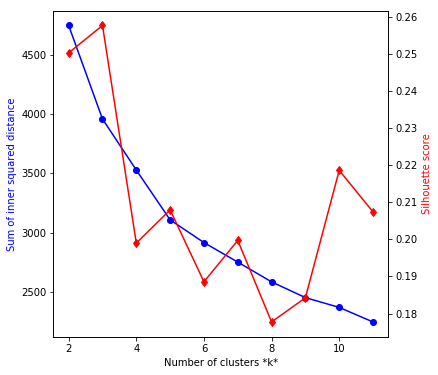

In [60]:
# Evaluate KMeans first to choose K
from sklearn.cluster import KMeans
import matplotlib.pyplot as plt
from sklearn.metrics import silhouette_score


sse = []
sil = []
list_k = list(range(2, 12))

for k in list_k:
    km = KMeans(n_clusters=k, random_state=0)
    km.fit(candidates_std)
    sse.append(km.inertia_)
    sil.append(silhouette_score(candidates_std, km.labels_))

fig, ax1 = plt.subplots(figsize=(6, 6))

ax2 = ax1.twinx()
ax1.plot(list_k, sse, 'bo-')
ax2.plot(list_k, sil, 'rd-')

ax1.set_xlabel(r'Number of clusters *k*')
ax1.set_ylabel('Sum of inner squared distance', color='b')
ax2.set_ylabel('Silhouette score', color='r')

plt.show()

From the figure, we can see `Sum of Squared Distance` going down when K becomes bigger. When K=2,3, `Silhouette Score` is higher, but SSE is still high at that time, we choose `K=10` for this project, it's balanced number for both `Sum of Squared Distance` and `Silhouette Score`.

In [61]:
# Run K-Means clustering algorithm again with best K
number_of_clusters = 10
kmeans = KMeans(n_clusters=number_of_clusters, random_state=0).fit(candidates_std)
# Show cluster for some cells
kmeans.labels_.tolist()[200:210]

[6, 1, 1, 6, 6, 8, 0, 5, 7, 8]

In [62]:
# Create cluster column in dataframe
candidates_df['Cluster'] = kmeans.labels_
candidates_df.head()

,Address,Latitude,Longitude,X,Y,Distance from downtown,Population,Density,Average Age,Average Education,Average Income,Boundary,Cinemas in cell,Cinemas in 1km,Cinemas in 3km,Malls in cell,Malls in 1km,Malls in 3km,Cluster
0,"2 Rue Forbes, Sainte-Anne-de-Bellevue, QC H9X 1W8",45.409692,-73.950681,582110.849218,5.028999e+06,32359.175834,3863.372339,375.969752,44.218433,2.074252,37302.680290,POLYGON ((-73.95058452723548 45.41488818683834...,0,0,0,0,0,0,2
1,"17 Rue East Cottages, Sainte-Anne-de-Bellevue,...",45.409574,-73.937904,583110.849218,5.028999e+06,31426.340867,4880.154283,481.326759,43.056650,2.032596,35051.174199,POLYGON ((-73.93780625038143 45.41477006043674...,0,0,0,0,0,0,2
2,"714 Rue Victoria, Baie-d'Urfé, QC H9X 2K7",45.409455,-73.925127,584110.849218,5.028999e+06,30497.762869,3823.000000,635.789124,47.900000,2.370787,44030.000000,POLYGON ((-73.92502805325407 45.41465050477576...,0,0,0,0,0,0,2
3,"20 Avenue Morningside, Senneville, QC H9X 1A9",45.417545,-73.956926,581610.849218,5.029865e+06,32534.078157,1065.656793,135.762692,48.099337,2.244369,44747.084649,"POLYGON ((-73.95683017180501 45.4227407435431,...",0,0,0,0,0,0,2
4,"21123 Ch Ste-Marie, Sainte-Anne-de-Bellevue, Q...",45.417427,-73.944147,582610.849218,5.029865e+06,31590.582160,4878.305382,463.110163,42.810550,2.012538,34602.058356,"POLYGON ((-73.94405009790495 45.4226233000435,...",0,0,0,0,0,0,2


Let's show clusters in different color in map view.

In [63]:
#import branca
#colormap = branca.colormap.linear.RdYlBu_11.scale(0, number_of_clusters)

def category_style(feature):
    c = feature['geometry']['label']
    return { 'color': c, 'fillColor': c, 'fillOpacity': 0.5 }

In [64]:
from shapely.geometry import mapping

colormap = ['lightgreen', 'green', 'darkblue', 'orange', 'darkred',
            'cadetblue', 'beige', 'purple', 'darkgreen', 'lightblue']

center = xy_to_lonlat((mtl_max_x+mtl_min_x)/2, (mtl_max_y+mtl_min_y)/2)
map_montreal = folium.Map(location=(center[1], center[0]), zoom_start=11)
folium.Marker(montreal_center, popup='Downtown Montreal').add_to(map_montreal)
folium.GeoJson(montreal_boroughs, style_function=boroughs_style, name='geojson').add_to(map_montreal)
for hexagon, label in zip(candidates_df['Boundary'], candidates_df['Cluster']):
    shape = mapping(hexagon.convex_hull)
    shape['label'] = f'{colormap[label]}'
    folium.GeoJson(shape, style_function=category_style).add_to(map_montreal)
map_montreal

Now, we show all information in one map view:

1. Clusters in colors for hexagons
2. Shopping malls in blue point
3. Cinemas in red point with yellow ring

In [65]:
def transparent_style(feature):
    c = feature['geometry']['label']
    return { 'color': c, 'fillColor': c, 'fillOpacity': 0.3 }

center = xy_to_lonlat((mtl_max_x+mtl_min_x)/2, (mtl_max_y+mtl_min_y)/2)
cinema_latlon = [(res[2], res[3]) for res in montreal_cinemas.values()]

map_montreal = folium.Map(location=(center[1], center[0]), zoom_start=11)
folium.Marker(montreal_center, popup='Downtown Montreal').add_to(map_montreal)
folium.TileLayer('cartodbpositron').add_to(map_montreal)
folium.GeoJson(montreal_boroughs, style_function=boroughs_style, name='geojson').add_to(map_montreal)
for hexagon, label in zip(candidates_df['Boundary'], candidates_df['Cluster']):
    shape = mapping(hexagon.convex_hull)
    shape['label'] = f'{colormap[label]}'
    folium.GeoJson(shape, style_function=transparent_style).add_to(map_montreal)
for res in montreal_shopping_malls.values():
    lat = res[2]; lon = res[3]
    color = 'blue'
    folium.CircleMarker([lat, lon], radius=3, color=color, fill=True, fill_color=color, fill_opacity=1).add_to(map_montreal)
for res in montreal_cinemas.values():
    lat = res[2]; lon = res[3]
    folium.CircleMarker([lat, lon], radius=3, color='yellow', weight=1, fill=True, fill_color='red', fill_opacity=1).add_to(map_montreal)

map_montreal

From the cluster plot in the above map view, we can see there is one cluster in light blue composed of 4 hexagons in downtown, there are full of cinemas and shopping malls in this cluster.

The purpule cluster contains area with a lot of shopping malls. The light green cluster contains more shopping malls and cinemas except light blue cluster.

Let's assign weigh to all three cinemas related features and combine them into one feature. Same for shopping malls. It's easier for sorting.

We will calculate weighed `Mall Score` and weighed `Cinema Score`, then generate a new `Score` feature for sorting.

The higher final score is, it means there is more shopping malls and fewer cinemas.

In [66]:
# get weighed Mall Score
candidates_df['Mall Score'] = candidates_df['Malls in cell']*5 + candidates_df['Malls in 1km']*3 + candidates_df['Malls in 3km']
# get weighed Cinema Score
candidates_df['Cinema Score'] = candidates_df['Cinemas in cell']*5 + candidates_df['Cinemas in 1km']*3 + candidates_df['Cinemas in 3km']
# get Score based on Cinema Score and Mall Score
candidates_df['Score'] = candidates_df['Mall Score'] - candidates_df['Cinema Score']

In [67]:
# Group the dataset by cluster and sort by Score in descending order
result = candidates_df.drop(columns=['Address', 'Latitude', 'Longitude', 'X', 'Y']).groupby(['Cluster'])['Population', 'Density', 'Average Age', 'Average Education', 'Average Income', 'Distance from downtown', 'Malls in cell', 'Malls in 1km', 'Malls in 3km', 'Cinemas in cell', 'Cinemas in 1km', 'Cinemas in 3km', 'Mall Score', 'Cinema Score', 'Score'].mean().sort_values(by='Score', ascending=False)

result

,Population,Density,Average Age,Average Education,Average Income,Distance from downtown,Malls in cell,Malls in 1km,Malls in 3km,Cinemas in cell,Cinemas in 1km,Cinemas in 3km,Mall Score,Cinema Score,Score
Cluster,,,,,,,,,,,,,,,
7,132613.112910,8251.628033,36.502441,2.074046,29123.672362,5419.586758,0.775000,1.075000,14.500000,0.000000,0.100000,5.050000,21.600000,5.350000,16.250000
8,105071.938178,5605.649108,39.149425,1.705989,28529.308817,8275.972087,0.382353,2.764706,9.617647,0.000000,0.941176,2.147059,19.823529,4.970588,14.852941
9,91008.689392,6314.493866,34.388414,2.303358,26052.755525,1064.351904,3.000000,6.750000,16.500000,3.000000,4.000000,10.750000,51.750000,37.750000,14.000000
4,90078.214607,6619.639456,34.868626,2.216594,27783.294485,2178.503595,0.500000,1.500000,23.250000,0.200000,1.450000,14.450000,30.250000,19.800000,10.450000
3,106965.249395,7532.926407,38.625538,1.343178,24366.938689,9499.042033,0.250000,0.527778,8.777778,0.000000,0.138889,1.638889,11.611111,2.055556,9.555556
5,46026.936051,4584.999600,40.518700,2.397311,42020.639340,6320.845972,0.238095,1.000000,12.714286,0.000000,0.523810,6.380952,16.904762,7.952381,8.952381
0,97452.924731,5310.918750,38.923962,1.851964,29281.350297,8417.676714,0.772727,0.954545,10.500000,1.181818,0.045455,3.454545,17.227273,9.500000,7.727273
6,108124.433171,4440.718174,38.533749,1.822560,28868.642808,9731.517424,0.217391,0.443478,6.434783,0.000000,0.086957,1.565217,8.852174,1.826087,7.026087
1,67089.893536,2615.346858,41.690317,1.486761,31400.386297,16603.376369,0.155844,0.389610,4.818182,0.000000,0.012987,0.571429,6.766234,0.610390,6.155844


`Cluster 7` has highest score, it has more shopping malls and fewer cinemas.

Let's explore more characteristics on `cluster 7`.

In [68]:
candidates_df[candidates_df['Cluster']==7].drop(columns=['Address', 'Latitude', 'Longitude', 'X', 'Y']).describe()

,Distance from downtown,Population,Density,Average Age,Average Education,Average Income,Cinemas in cell,Cinemas in 1km,Cinemas in 3km,Malls in cell,Malls in 1km,Malls in 3km,Cluster,Mall Score,Cinema Score,Score
count,40.000000,40.000000,40.000000,40.000000,40.000000,40.000000,40.0,40.000000,40.000000,40.00000,40.000000,40.000000,40.0,40.000000,40.000000,40.000000
mean,5419.586758,132613.112910,8251.628033,36.502441,2.074046,29123.672362,0.0,0.100000,5.050000,0.77500,1.075000,14.500000,7.0,21.600000,5.350000,16.250000
std,1854.333169,22909.968441,1789.093565,1.431799,0.201771,2911.562095,0.0,0.303822,2.707539,0.80024,1.071484,3.954874,0.0,7.389528,2.931264,8.113774
min,1952.670347,89170.000000,5353.168044,33.600000,1.586892,24715.000000,0.0,0.000000,1.000000,0.00000,0.000000,7.000000,7.0,13.000000,1.000000,3.000000
25%,4085.078312,113829.451571,7440.062372,36.050423,1.952450,25985.847854,0.0,0.000000,2.000000,0.00000,0.000000,11.750000,7.0,16.000000,2.000000,11.000000
50%,5264.889535,139052.644630,7819.535410,36.531560,2.131147,30124.081923,0.0,0.000000,5.000000,1.00000,1.000000,14.500000,7.0,19.000000,6.000000,13.000000
75%,6763.023333,140789.752715,8806.940063,37.400000,2.209832,31660.322973,0.0,0.000000,7.000000,1.00000,2.000000,17.000000,7.0,27.000000,8.000000,25.250000
max,9458.115449,166520.000000,12792.127921,39.434053,2.426965,34222.429860,0.0,1.000000,10.000000,3.00000,4.000000,24.000000,7.0,39.000000,10.000000,31.000000


There are **40 hexagons** in `Cluster 7` with average 0.77 *Malls in local* and 0.0 *Cinema in local*.

Let's plot all clusters for comparison of each feature in bar chart using __matplotlib.pyplot__ library. We highlight `Cluster 7` which is our target cluster.

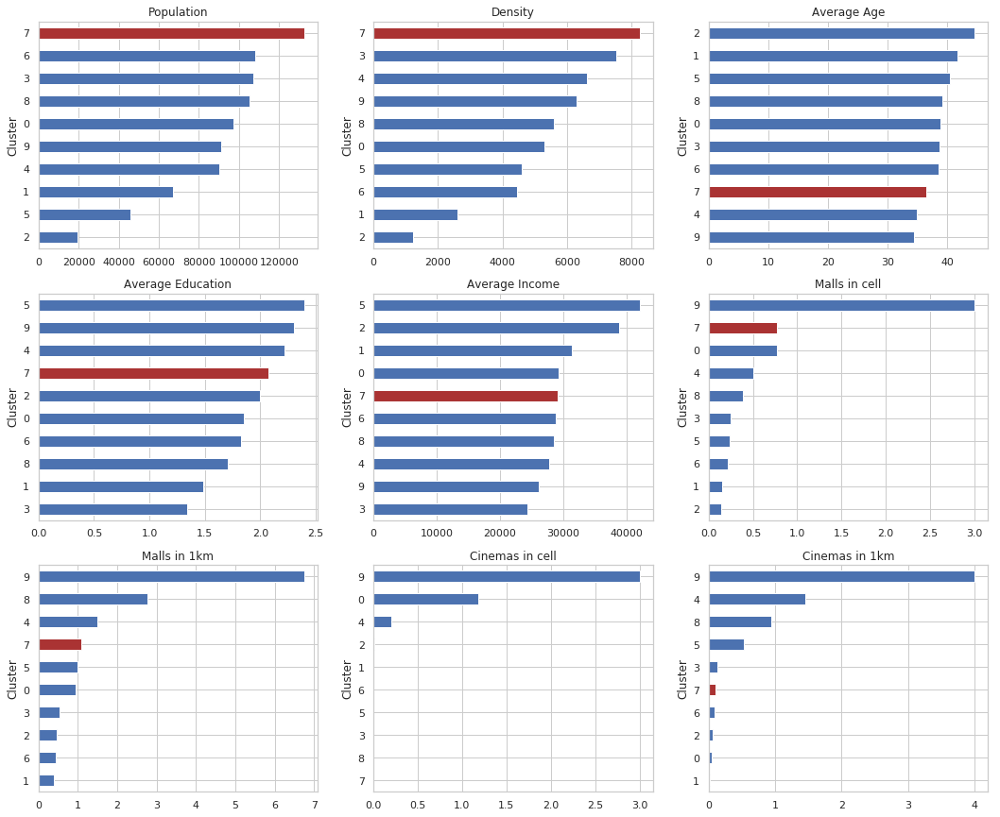

In [70]:
import matplotlib.pyplot as plt

def draw_barchart(dataframe, highlight_index):
    fig = plt.figure(figsize=(18, 15))
    n_rows = n_cols = math.ceil(math.sqrt(dataframe.columns.size))
    for i, col in enumerate(dataframe.columns):
        df = dataframe[[col]].sort_values(by=col)
        ax = fig.add_subplot(n_rows, n_cols, i+1)
        df.plot.barh(ax=ax)
        pos = df.index.get_loc(highlight_index)
        ax.patches[pos].set_facecolor('#aa3333')
        ax.set_title(col)
        ax.get_legend().remove()
    # fig.tight_layout()
    plt.show()

draw_barchart(result[['Population', 'Density', 'Average Age', 'Average Education', 'Average Income',
                      'Malls in cell', 'Malls in 1km', 'Cinemas in cell', 'Cinemas in 1km']], 7)

From the bar chart, we can clearly see `Cluster 7` has the most population and density among all the clusters. Furthermore, it has fairly more shopping centers in the hexagon area or nearby and relatively fewer cinemas.

Next, we sort all hexagons in Cluster 7 by `Score` in descending order and pick the first 5 hexagons. They will be our first choice position to open a cinema.

In [71]:
selection_df = candidates_df[candidates_df['Cluster'] == 7].sort_values(['Score'], ascending=[False]).head(5)
selection_df[['Population', 'Density', 'Average Age', 'Average Education', 'Average Income', 'Malls in cell', 'Malls in 1km', 'Malls in 3km', 'Cinemas in cell', 'Cinemas in 1km', 'Cinemas in 3km', 'Mall Score', 'Cinema Score', 'Score']]

,Population,Density,Average Age,Average Education,Average Income,Malls in cell,Malls in 1km,Malls in 3km,Cinemas in cell,Cinemas in 1km,Cinemas in 3km,Mall Score,Cinema Score,Score
377,104000.000000,12792.127921,33.600000,2.419321,30361.000000,1,4,21,0,0,7,38,7,31
388,139590.000000,8806.940063,37.400000,1.955852,32008.000000,1,3,17,0,0,1,31,1,30
360,97394.898948,12249.970165,33.806291,2.426965,31530.751299,3,1,21,0,0,10,39,10,29
376,107878.011953,12357.887793,34.014061,2.368820,30540.462930,2,2,19,0,0,6,35,6,29
387,139857.436623,8801.714957,37.312172,1.928706,31468.735348,2,2,14,0,0,2,30,2,28


As above statistics information, there are 1~3 shopping malls in local and more shopping malls nearby, but without any cinema within 1 km. Looks quite good selections.

Let's plot `Cluster 7` hexagons in the map view, and highlight our 5 choices as well.

In [72]:
# Plot the target cluster and highlight the choices
center = xy_to_lonlat((mtl_max_x+mtl_min_x)/2, (mtl_max_y+mtl_min_y)/2)
map_montreal = folium.Map(location=(center[1], center[0]), zoom_start=11)
folium.Marker(montreal_center, popup='Downtown Montreal').add_to(map_montreal)
folium.GeoJson(montreal_boroughs, style_function=boroughs_style, name='geojson').add_to(map_montreal)
HeatMap(cinema_latlon).add_to(map_montreal)

for hexagon, label in zip(candidates_df['Boundary'], candidates_df['Cluster']):
    shape = mapping(hexagon.convex_hull)
    if label == 7:
        shape['label'] = colormap[label]
    else:
        shape['label'] = 'gray'
    folium.GeoJson(shape, style_function=transparent_style).add_to(map_montreal)
for area in selection_df['Boundary']:
    shape = mapping(area.convex_hull)
    shape['label'] = 'red'
    folium.GeoJson(shape, style_function=transparent_style).add_to(map_montreal)
for res in montreal_shopping_malls.values():
    lat = res[2]; lon = res[3]
    color = 'blue'
    folium.CircleMarker([lat, lon], radius=3, color=color, fill=True, fill_color=color, fill_opacity=1).add_to(map_montreal)
map_montreal

This concludes our analysis. We have found out 5 most promising zones with more shopping malls nearby and fewer cinema around the area. Each zone is in regular hexagon shape which is popular in map view. The length of side is 500 meters. It covers around 0.65 square kilometers area. The zones in the cluster has the most population and density comparing with other clusters.

## Results and Discussion <a name="results"></a>

We generated hexagon area with length of side of 500 meters all over Montreal island. And we group them into 10 clusters according to census data information including population, density, age, education and income. Shopping center information and existing cinemas information are also considered when running clustering algorithm.

From data analysis and visualization, we can see cinemas are always located near shopping malls usually, which inspired us to find out the area with more shopping malls and fewer cinemas.

After K-Means Clustering machine learning algorithm, we got the cluster with most shopping malls nearby and fewer cinemas in average. We also discovered the cluster's other characteristics. It shows the cluster has the most population and density which imply highest traffice among all the clusters.

There are 40 hexagon area in this cluster, we sort all these hexagon areas by shopping malls and cinema info in descending order which targets to cover more shopping malls and fewer cinemas in the local cell or nearby.

We draw our conclusion with 5 most promising hexagon areas satisfying all our conditions. These recommended zones shall be a good starting point for further analysis. There are also other factors which could be taken into account, e.g. real traffic data and the revenue of every cinema, parking lot nearby. They will be helpful to find more accurate result.


## Conclusion <a name="conclusion"></a>

The purpose of this project is to find an area on Montreal island to open a cinema. We divide the island into regular hexagons with length of side of 500 meters. It's fairly small zone to open a cinema. After fetching shopping malls and cinemas information by using Foursquare APIs and Montreal census data from Montreal official website, K-Means clustering algorithm group all these hexagons into 10 groups based on these fundamental data. We picked the cluster with more shopping malls and fewer cinemas in average and sort them to get the most 5 promising zones which are used as starting points for final exploration by stakeholders.

Final decission on optimal cinema location will be made by stakeholders based on specific characteristics of neighborhoods and locations in every recommended zone, taking into consideration additional factors like parking lot of each location, traffic of existing cinema in the cluster and current revenu of them, etc.

## Reference <a name="reference"></a>

[Capstone Project - The Battle of the Neighborhoods](https://cocl.us/coursera_capstone_notebook)